# ASSIGNMENT 2: WIND SPEED MEASUREMENTS

## Imports

In [3]:
import pandas as pd
import pymysql.cursors
import matplotlib.pyplot as plt
import numpy as np

## Import Data 

Connect to the MySQL database 

In [4]:
#db=pymysql.connect(host="data02.windenergy.dtu.dk",user="students",password="H040",charset='utf8')

Execute the SQL command on the server and load the results in the dataframe. Treat field "name" as a date-time and use this as the index of the dataframe.

In [5]:
#WindData=pd.read_sql("select * from c46400.dataset_as03;",con=db,parse_dates="name",index_col="name")
#WindData.describe()

Save dataframe as CSV so there is no need to connect to MySQL database every time

In [6]:
#WindData.to_csv('WindData.csv', index=True)

In [7]:
WindData = pd.read_csv('WindData.csv', parse_dates=True, index_col=0)
WindData.describe()

,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
count,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,...,7840.000000,7837.000000,7840.000000,7840.000000,7807.000000,7575.000000,7840.000000,7836.000000,7813.000000,7840.000000
mean,9.171476,0.667874,7.142197,11.040740,9.688137,0.677135,7.612990,11.575186,8.925705,0.688993,...,0.701821,6.306278,10.276677,170.043151,5.754241,0.083584,0.370974,99.300536,-10.277487,1.206926
std,4.712528,0.445456,3.670575,5.679712,4.933472,0.454641,4.293733,5.651078,4.619114,0.459581,...,0.359827,2.892863,4.264462,89.185167,5.258565,0.288158,0.206616,5.428837,5.442326,0.215100
min,0.000000,0.000000,0.000000,0.000000,0.522059,0.000000,0.522059,0.522059,0.000000,0.000000,...,0.040000,0.010000,0.810000,0.100000,0.309996,-0.870000,0.030000,2.000000,-28.873700,0.520000
25%,6.133538,0.368242,4.795138,7.366343,6.405145,0.374129,4.949900,7.653950,5.975027,0.381133,...,0.450000,4.520000,7.590000,100.800000,3.482905,-0.040000,0.230000,100.000000,-13.452200,1.100000
50%,8.697975,0.585182,6.837950,10.397250,8.881545,0.591761,6.927900,10.679800,8.419600,0.602970,...,0.660000,6.230000,9.980000,146.300000,4.614180,0.040000,0.350000,100.000000,-10.518800,1.140000
75%,11.468300,0.870433,9.120593,13.776300,11.822550,0.878780,9.344527,14.246650,11.126575,0.896857,...,0.890000,7.910000,12.340000,258.125000,6.199320,0.140000,0.480000,100.000000,-8.134290,1.220000
max,35.419800,4.424590,24.684500,42.342500,35.611500,6.531950,24.667700,43.244400,35.281400,4.317390,...,2.730000,19.940000,32.170000,359.300000,57.243000,4.470000,2.780000,100.000000,16.077200,4.100000


## Questions

### Question 1)

Make 10 minute time-series plots of the different channels of mast data  (cups, sonic, temperature and vane) including mean, minimum and maximum. \
Can you identify any outliers or other erroneous data in the cup, sonic or wind vane data? Find a way of excluding these points from the further analysis. A useful technique is to replace excluded values by NaNs in the dataset. This way they will not be inadvertently used in mean calculations or included in regression plots.

#### Cup 116m

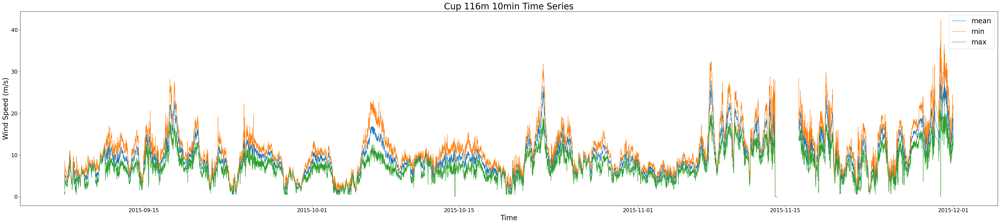

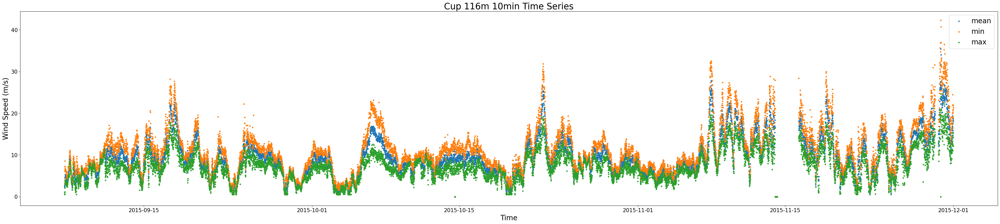

In [26]:
def plot_scatter_and_lines(measurement,df_mean,df_max = None,df_min = None,height = 100, unit ='Wind Speed (m/s)' ):
    plt.figure(figsize=(50,10))
    plt.plot(df_mean, label = 'mean', linewidth=1)
    if df_max is not None and df_min is not None:
        plt.plot(df_max, label = 'min', linewidth=1)
        plt.plot(df_min, label = 'max', linewidth=1)
    plt.xlabel('Time', fontsize=20)
    plt.ylabel(unit, fontsize=20)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title(f'{measurement} {height}m 10min Time Series', fontsize=25)
    plt.legend(fontsize=20)
    plt.show()


    plt.figure(figsize=(50, 10))
    plt.scatter(df_mean.index, df_mean, label='mean', s=10)
    if df_max is not None and df_min is not None:
        plt.scatter(df_max.index, df_max, label='min', s=10)
        plt.scatter(df_min.index, df_min, label='max', s=10)
    plt.xlabel('Time', fontsize=20)
    plt.ylabel(unit, fontsize=20)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title(f'{measurement} {height}m 10min Time Series', fontsize=25)
    plt.legend(fontsize=20)
    plt.show()

plot_scatter_and_lines('Cup',WindData['Cup116m_Mean'],WindData['Cup116m_Max'],WindData['Cup116m_Min'],116)

#### Cup 114m

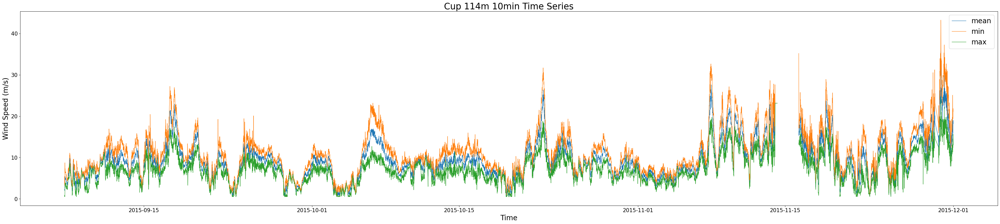

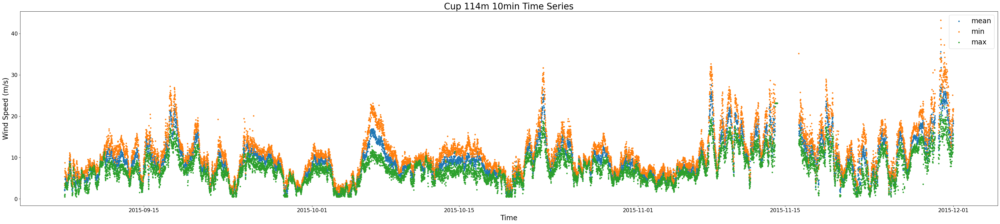

In [27]:
plot_scatter_and_lines('Cup',WindData['Cup114m_Mean'],WindData['Cup114m_Max'],WindData['Cup114m_Min'],114)

#### Cup 100m

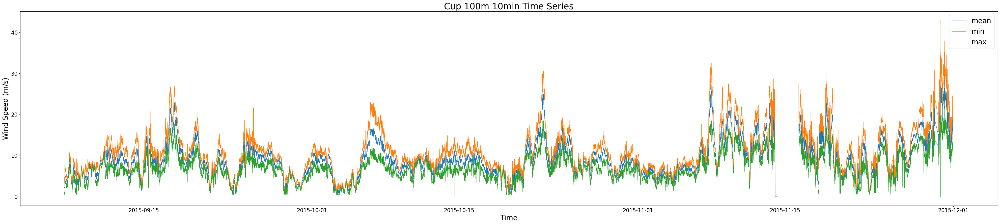

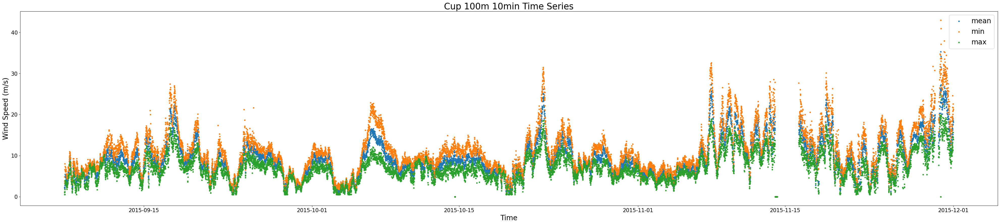

In [28]:
plot_scatter_and_lines('Cup',WindData['Cup100m_Mean'],WindData['Cup100m_Max'],WindData['Cup100m_Min'])


#### Sonic

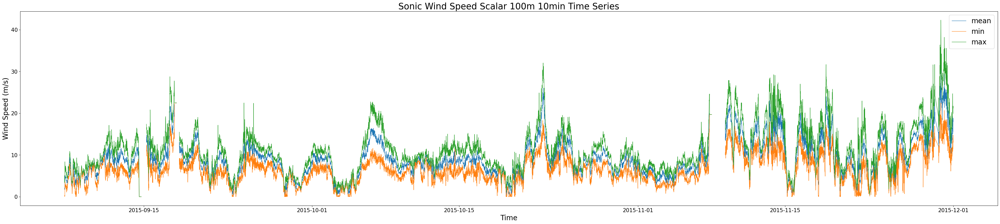

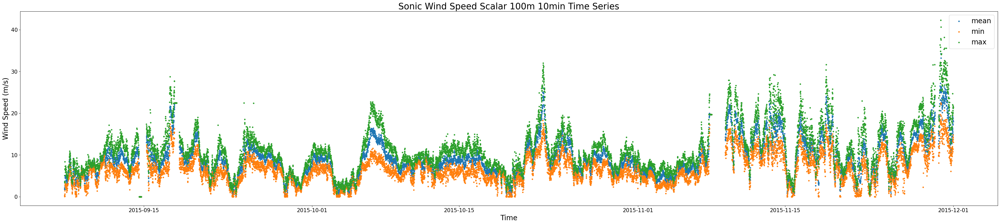

In [29]:
plot_scatter_and_lines('Sonic Wind Speed Scalar',WindData['Sonic100m_Scalar_Mean'],
                       WindData['Sonic100m_Scalar_Min'],WindData['Sonic100m_Scalar_Max'])

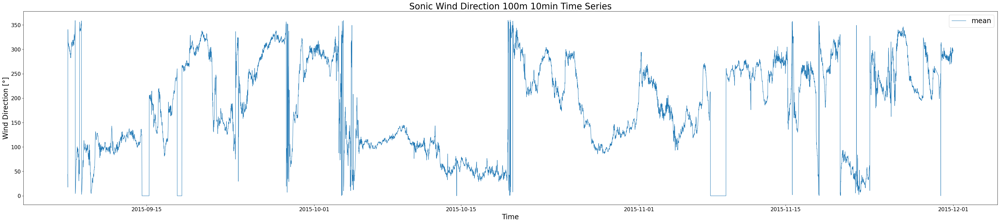

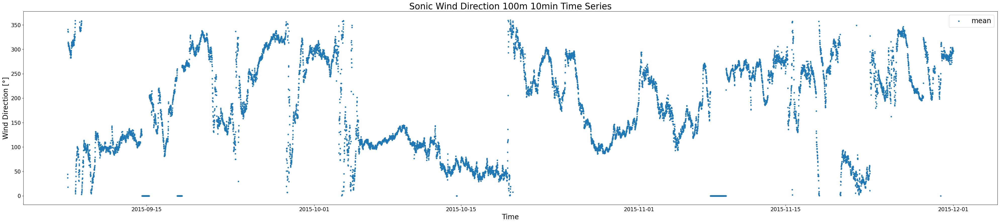

In [ ]:
plot_scatter_and_lines('Sonic Wind Direction',WindData['Sonic100m_Dir'], unit = 'Wind Direction [°]')

#### Termometer

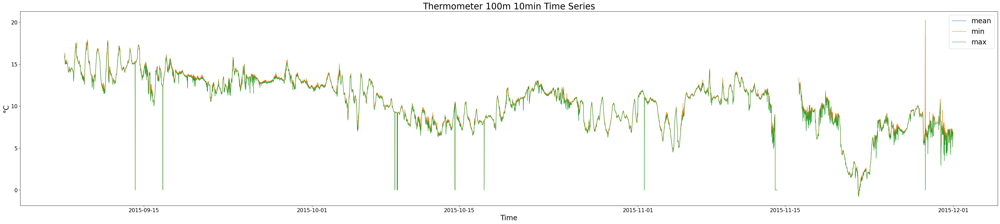

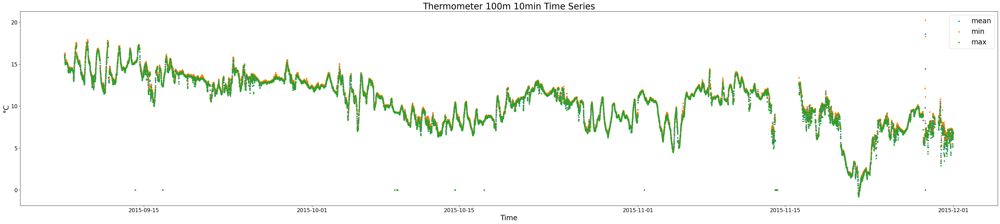

In [30]:
plot_scatter_and_lines('Thermometer',WindData['Temp100m_Mean'],WindData['Temp100m_Max'],WindData['Temp100m_Min'],unit = '°C')

#### Vane

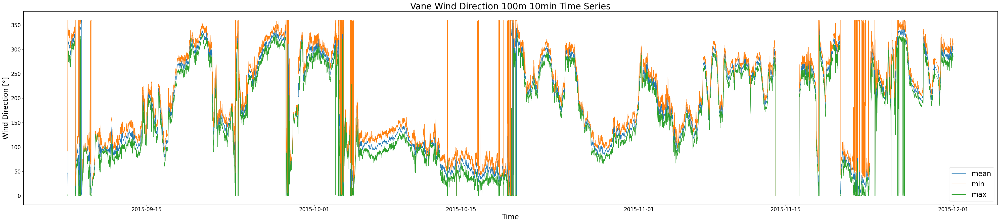

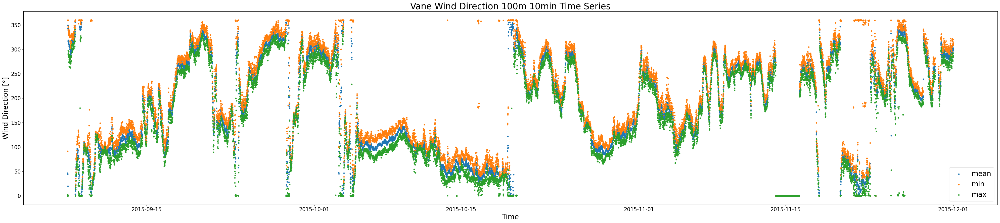

In [ ]:
plot_scatter_and_lines('Vane Wind Direction',WindData['Vane100m_Mean'],WindData['Vane100m_Max'],
                       WindData['Vane100m_Min'], unit = 'Wind Direction [°]')

#### Erroneous Data

By looking at the cups, vane and thermometer plots, it seems the is missing data the around the 2015-11-15. 

In [15]:
# WD_miss.plot(figsize=(15, 10))
# plt.title('WD_miss DataFrame Plot', fontsize=20)
# plt.xlabel('Time', fontsize=15)
# plt.ylabel('Values', fontsize=15)
# plt.legend(title='Columns', fontsize=12)
# plt.show()

For the Cup, Vane and Termometer measurements, it will be looked at the data for those periods that the values recorded keeps repeating for more than 5 hours; those periods will be considered as erroneous data and then be converted to NaN

In [16]:
meas = ['Cup116m_Mean', 'Cup116m_Min', 'Cup116m_Max', 'Cup116m_Stdv',
       'Cup114m_Mean', 'Cup114m_Min', 'Cup114m_Max', 'Cup114m_Stdv',
       'Cup100m_Mean', 'Cup100m_Min', 'Cup100m_Max', 'Cup100m_Stdv',
       'Vane100m_Mean', 'Vane100m_Min', 'Vane100m_Max', 'Vane100m_Stdv',
       'Temp100m_Mean', 'Temp100m_Min', 'Temp100m_Max', 'Temp100m_Stdv']

In [17]:
def convert_repeating_to_nan(df, columns, threshold_hours=5):
    threshold = threshold_hours * 6
    removed_rows = pd.DataFrame()
    for column in columns:
        repeating = df[column].eq(df[column].shift())
        count_repeats = repeating.groupby((repeating != repeating.shift()).cumsum()).cumsum()
        periods_to_nan = count_repeats >= threshold
        periods_to_nan = periods_to_nan.groupby((periods_to_nan != periods_to_nan.shift()).cumsum()).transform('any')
        removed_rows = pd.concat([removed_rows, df[periods_to_nan]])
        df.loc[periods_to_nan, column] = np.nan
    removed_rows = removed_rows.drop_duplicates()
    return df, removed_rows

WindData_cleaned, removed_rows_df = convert_repeating_to_nan(WindData, meas)

In [18]:
removed_rows_df

,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
name,,,,,,,,,,,,,,,,,,,,,
2015-11-14 06:10:00,0.0000,0.00000,0.0000,0.0000,23.1327,0.000008,23.1327,23.1327,0.0000,0.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-14 06:20:00,0.0000,0.00000,0.0000,0.0000,23.1327,0.000008,23.1327,23.1327,0.0000,0.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-14 06:30:00,0.0000,0.00000,0.0000,0.0000,23.1327,0.000008,23.1327,23.1327,0.0000,0.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-14 06:40:00,0.0000,0.00000,0.0000,0.0000,23.1327,0.000008,23.1327,23.1327,0.0000,0.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-14 06:50:00,0.0000,0.00000,0.0000,0.0000,23.1327,0.000008,23.1327,23.1327,0.0000,0.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-16 06:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-16 06:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-16 06:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The same principal is applied to the sonic data

In [19]:
meas2 = ['Sonic100m_Scalar_Mean', 'Sonic100m_Scalar_Min', 'Sonic100m_Scalar_Max', 'Sonic100m_Dir', 'Sonic100m_Scalar_Stdv']

In [20]:
WindData_cleaned_2, removed_rows_df_sonic = convert_repeating_to_nan(WindData_cleaned, meas2)

In [21]:
removed_rows_df_sonic

,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
name,,,,,,,,,,,,,,,,,,,,,
2015-09-14 18:20:00,3.57606,0.317895,2.91275,4.35548,3.44911,0.306944,2.61466,4.23437,3.32940,0.342049,...,0.80,0.73,6.41,173.9,14.81140,0.95,0.68,99.0,-12.5071,1.99
2015-09-14 18:30:00,2.80043,0.356980,1.96525,3.66166,2.69623,0.340221,1.83844,3.40146,2.63096,0.257495,...,1.36,0.05,6.27,173.7,33.16700,0.46,0.78,99.0,-10.5562,2.17
2015-09-14 18:40:00,2.40846,0.369675,1.64018,3.07266,2.35168,0.366510,1.58187,3.06999,2.47787,0.391102,...,0.76,0.54,5.13,162.4,16.48760,1.84,0.48,100.0,-15.6021,2.30
2015-09-14 18:50:00,3.12209,0.371370,2.46437,3.86027,3.08120,0.365385,2.40415,3.81434,3.16692,0.366431,...,0.59,1.77,5.65,148.8,9.92558,1.95,0.40,99.0,-15.0734,2.33
2015-09-14 19:00:00,2.80024,0.290466,2.25851,3.55710,2.74725,0.293857,2.13308,3.51413,2.81233,0.355861,...,0.73,1.43,5.29,138.7,11.12280,1.36,0.54,99.0,-14.4977,2.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-09 06:30:00,11.47160,0.734313,9.23822,13.20900,11.37840,0.754164,8.93213,13.12930,11.37510,0.800522,...,0.75,9.48,14.01,270.0,NaN,-0.08,0.38,100.0,NaN,1.11
2015-11-09 06:40:00,11.51940,0.625117,9.11157,13.61050,11.38310,0.628649,9.20211,13.44100,11.34590,0.740527,...,0.77,9.42,15.41,266.7,NaN,-0.11,0.35,100.0,NaN,1.10
2015-11-09 06:50:00,12.95570,0.753983,10.18000,15.44210,12.79950,0.764120,9.84805,15.53720,12.85060,0.790886,...,0.85,10.51,15.00,262.3,NaN,-0.04,0.40,100.0,NaN,1.11


Apart fom the erronous measurements, we will remove outliers.

 In terms of wind directions it is checked that there are no values outside 0-360 range so there is no need to remove outliers

In [22]:
print(WindData_cleaned_2['Vane100m_Max'].max())
print(WindData_cleaned_2['Vane100m_Min'].max())
print(WindData_cleaned_2['Vane100m_Mean'].max())
print(WindData_cleaned_2['Sonic100m_Dir'].max())
print(WindData_cleaned_2['Vane100m_Max'].min())
print(WindData_cleaned_2['Vane100m_Min'].min())
print(WindData_cleaned_2['Vane100m_Mean'].min())
print(WindData_cleaned_2['Sonic100m_Dir'].min())

359.994
344.642
359.815
359.919
0.0
0.0
0.0
0.0


For the rest of measurements, a filter to remove outliers is applied. The filter is a really non restrective one as the deviations in the measurements could be conisderably wide, thus the mutiplier to the IQR chosen is 5

In [23]:
meas3 = ['Cup116m_Mean', 'Cup116m_Min', 'Cup116m_Max', 'Cup116m_Stdv',
       'Cup114m_Mean', 'Cup114m_Min', 'Cup114m_Max', 'Cup114m_Stdv',
       'Cup100m_Mean', 'Cup100m_Min', 'Cup100m_Max', 'Cup100m_Stdv',
       'Temp100m_Mean', 'Temp100m_Min', 'Temp100m_Max', 'Temp100m_Stdv',
       'Sonic100m_Scalar_Mean', 'Sonic100m_Scalar_Min', 'Sonic100m_Scalar_Max', 'Sonic100m_Scalar_Stdv']

In [24]:
# def identify_outliers(df, columns, multiplier=5):
#     outliers = pd.DataFrame()
#     for column in columns:
#         Q1 = df[column].quantile(0.25)
#         Q3 = df[column].quantile(0.75)
#         IQR = Q3 - Q1
#         lower_bound = Q1 - multiplier * IQR
#         upper_bound = Q3 + multiplier * IQR
#         outliers = pd.concat([outliers, df[(df[column] < lower_bound) | (df[column] > upper_bound)]])
#     return outliers.drop_duplicates()

# outliers_df = identify_outliers(WindData, meas3, multiplier=5)

# WindData_F = WindData_cleaned_2.drop(outliers_df.index)

In [25]:
plot_thermometer(WindData_F)

NameError: name 'plot_thermometer' is not defined

filter the thermometer outlies, to remove sudden changes

In [ ]:
#function to filter it out


Outlier detected at index 4483, value: 0.0, prev_value: 9.2302, next_value: 9.20187, column: Temp100m_Mean
Outlier detected at index 4486, value: 0.0, prev_value: 9.20368, next_value: 9.20317, column: Temp100m_Mean
Outlier detected at index 4487, value: 9.20317, prev_value: 0.0, next_value: 0.0, column: Temp100m_Mean
                     Cup116m_Mean  Cup116m_Stdv  Cup116m_Min  Cup116m_Max  \
name                                                                        
2015-09-07 11:00:00       2.29737      0.436317     1.018530      3.19492   
2015-09-07 11:10:00       2.33373      1.142690     0.540292      6.16171   
2015-09-07 11:20:00       2.65680      0.516193     1.161560      4.43188   
2015-09-07 11:30:00       2.19811      0.616147     0.622069      3.82984   
2015-09-07 11:40:00       2.81388      0.951594     1.138440      7.15864   
2015-09-07 11:50:00       3.99099      0.955631     2.091710      8.56630   
2015-09-07 12:00:00       4.70102      0.573233     3.396180     

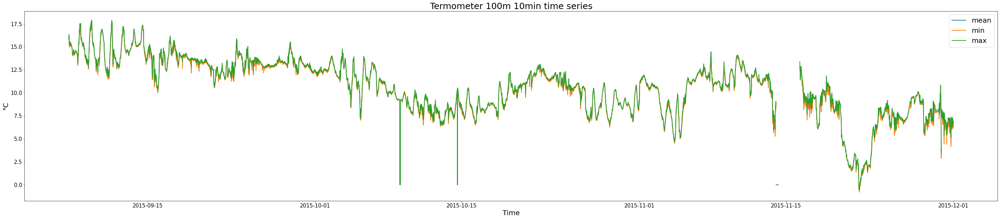

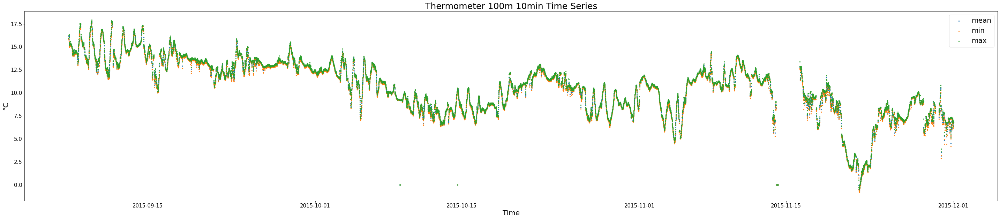

In [ ]:
import numpy as np

def remove_outliers(df, column, threshold):
    """
    Remove outliers from a DataFrame based on sudden changes in a specified column.
    
    Parameters:
    df (pd.DataFrame): The input DataFrame.
    column (str): The column name to check for outliers.
    threshold (float): The threshold for detecting sudden changes.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers set to NaN.
    """
    df_cleaned = df.copy()
    for i in range(1, len(df) - 1):
        prev_value = df.iloc[i - 1][column]
        current_value = df.iloc[i][column]
        next_value = df.iloc[i + 1][column]
        
        if abs(current_value - prev_value) > threshold and abs(current_value - next_value) > threshold:
            df_cleaned.at[df.index[i], column] = np.nan
            print(f"Outlier detected at index {i}, value: {current_value}, prev_value: {prev_value}, next_value: {next_value}, column: {column}")
    
    # Debugging: Print the first few rows of the cleaned DataFrame to verify NaNs
    print(df_cleaned.head(10))
    
    return df_cleaned

# Example usage:
WindData_F2 = remove_outliers(WindData_F, 'Temp100m_Mean', threshold=5.0)
WindData_F2 = remove_outliers(WindData_F, 'Temp100m_Max', threshold=5.0)
WindData_F2 = remove_outliers(WindData_F, 'Temp100m_Min', threshold=5.0)

plot_thermometer(WindData_F2)

In [ ]:
WindData_F2

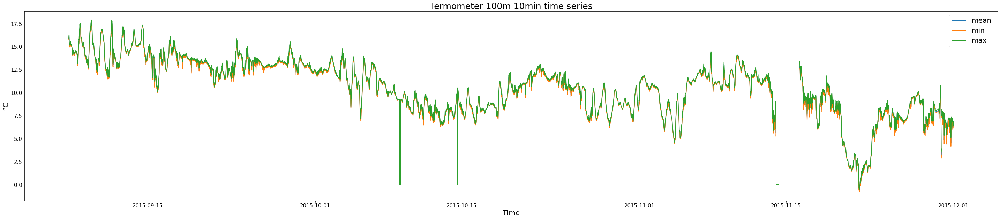

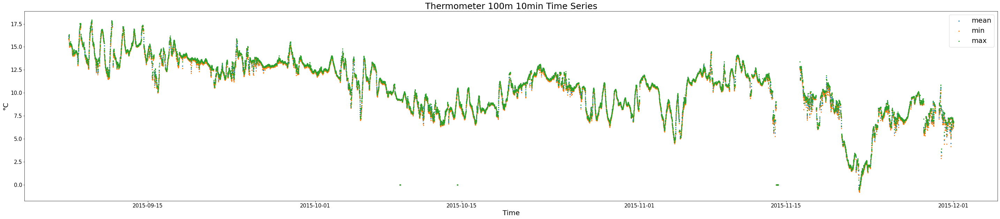

In [ ]:
def filter_temperature_anomalies(df, columns, window=6, threshold=7):
    """
    Replace values with NaN if the difference between the mean of the last window values
    and the current value is greater than threshold.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data.
    columns (list): List of column names to apply the filtering.
    window (int): Number of previous values to compute the mean.
    threshold (float): Threshold for anomaly detection.
    
    Returns:
    pd.DataFrame: Modified DataFrame with anomalies replaced by NaN.
    """
    df = df.copy()
    
    for col in columns:
        for i in range(window, len(df)):
            mean_last_values = df[col].iloc[i-window:i].mean()
            if abs(df[col].iloc[i] - mean_last_values) > threshold:
                df.at[i, col] = np.nan
    
    return df

# Example usage:
columns_to_check = ["Temp100m_Min", "Temp100m_Max", "Temp100m_Mean"]
WindData_F2 = filter_temperature_anomalies(WindData_F, columns_to_check)
plot_thermometer(WindData_F2)

Outlier detected at index 960, value: 0.0, column: Temp100m_Min
Outlier detected at index 1333, value: 0.0, column: Temp100m_Min
Outlier detected at index 4503, value: 0.0, column: Temp100m_Min
Outlier detected at index 4533, value: 0.0, column: Temp100m_Min
Outlier detected at index 4536, value: 0.0, column: Temp100m_Min
Outlier detected at index 4538, value: 0.0, column: Temp100m_Min
Outlier detected at index 4539, value: 0.0, column: Temp100m_Min
Outlier detected at index 4540, value: 0.0, column: Temp100m_Min
Outlier detected at index 5324, value: 0.0, column: Temp100m_Min
Outlier detected at index 5325, value: 0.0, column: Temp100m_Min
Outlier detected at index 5326, value: 0.0, column: Temp100m_Min
Outlier detected at index 5327, value: 0.0, column: Temp100m_Min
Outlier detected at index 5726, value: 0.0, column: Temp100m_Min
Outlier detected at index 7913, value: 0.0, column: Temp100m_Min
Outlier detected at index 9703, value: 0.0, column: Temp100m_Min
Outlier detected at index 

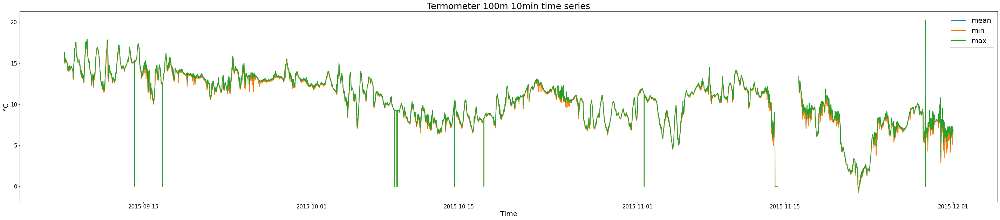

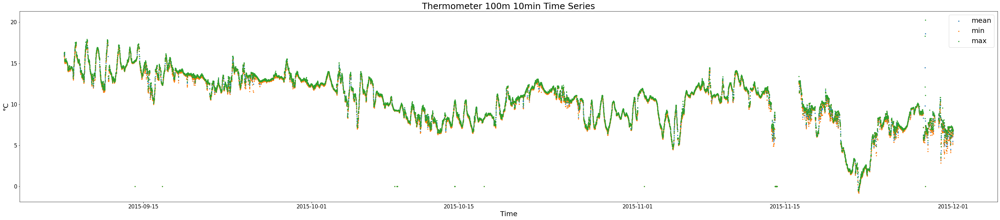

In [ ]:
def remove_zeros(df, column):
    """
    Remove outliers from a DataFrame based on sudden changes in a specified column.
    
    Parameters:
    df (pd.DataFrame): The input DataFrame.
    column (str): The column name to check for outliers.
    threshold (float): The threshold for detecting sudden changes.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers set to NaN.
    """
    df_cleaned = df.copy()
    for i in range(1, len(df) - 1):
        current_value = df.iloc[i][column]
        
        
        if (current_value == 0.0):
            df_cleaned.at[df.index[i], column] = np.nan
            print(f"Outlier detected at index {i}, value: {current_value}, column: {column}")
    
    # Debugging: Print the first few rows of the cleaned DataFrame to verify NaNs
    #print(df_cleaned.head(10))
    
    return df_cleaned
columns_to_check = ["Temp100m_Min", "Temp100m_Max", "Temp100m_Mean"]

WindData_zeros_removed = remove_zeros(WindData,'Temp100m_Min')
WindData_zeros_removed = remove_zeros(WindData,'Temp100m_Max')
WindData_zeros_removed = remove_zeros(WindData,'Temp100m_Mean')

plot_thermometer(WindData_zeros_removed)


In [ ]:
np.mean(WindData_zeros_removed['Temp100m_Max'] == WindData['Temp100m_Max'])

0.9756703078450845

### Question 2)

Plot the ratio of the cup anemometer and sonic wind speeds at 100m as a function of wind direction. Does the pattern you see agree with your understanding of how the instruments are mounted and their respective boom directions? 

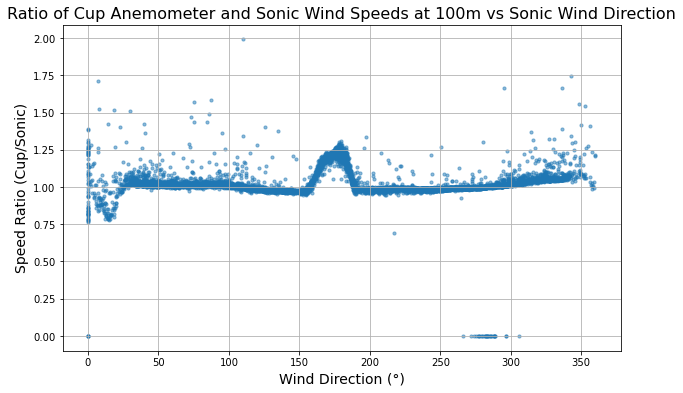

In [ ]:
WindData_F['Speed_Ratio'] = WindData_F['Cup100m_Mean'] / WindData_F['Sonic100m_Scalar_Mean']

plt.figure(figsize=(10, 6))
plt.scatter(WindData_F['Sonic100m_Dir'], WindData_F['Speed_Ratio'], s=10, alpha=0.5)
plt.xlabel('Wind Direction (°)', fontsize=14)
plt.ylabel('Speed Ratio (Cup/Sonic)', fontsize=14)
plt.title('Ratio of Cup Anemometer and Sonic Wind Speeds at 100m vs Sonic Wind Direction', fontsize=16)
plt.grid(True)
plt.show()

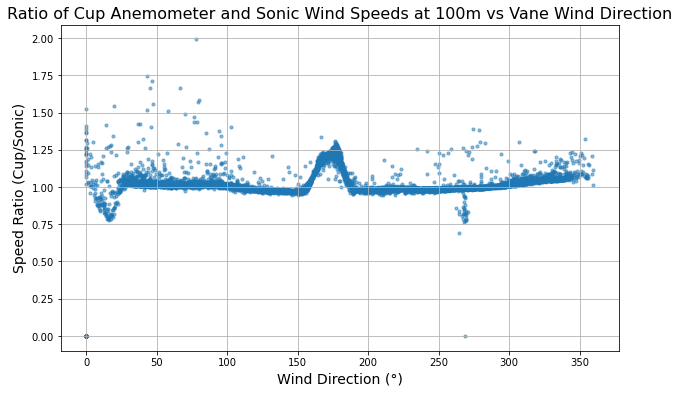

In [ ]:
WindData_F['Speed_Ratio'] = WindData_F['Cup100m_Mean'] / WindData_F['Sonic100m_Scalar_Mean']

plt.figure(figsize=(10, 6))
plt.scatter(WindData_F['Vane100m_Mean'], WindData_F['Speed_Ratio'], s=10, alpha=0.5)
plt.xlabel('Wind Direction (°)', fontsize=14)
plt.ylabel('Speed Ratio (Cup/Sonic)', fontsize=14)
plt.title('Ratio of Cup Anemometer and Sonic Wind Speeds at 100m vs Vane Wind Direction', fontsize=16)
plt.grid(True)
plt.show()

We see that the cup is mounted upstream with southwind, and the sonic is mounted downstream, and would expect higher wind speeds measuremtns  from the cup when the wind is southern (180 degrees), and similarly higher ws meas from the sonic when the wind is northern (0/360 degrees), and this is what we see. nice.

### Question 3)

The coordinates of the mast are (56.440547°N, 8.150868°E). Noting the date of the dataset, examine the site on Google Earth as it was at the time of the measurements. Identify possible obstacles (especially neighbouring wind turbines). A mast should not be considered as an obstacle but what is the justification for this?

dataset date: 2015
google earth location pictures: 2021

there are 4 turbines directly north of the mast, and there is also three masts located N-W of the mast. otherwise it looks pretty flat. 

A mast is not considered an obstacle in wind measurements because it is a slender structure with minimal impact on the surrounding airflow. Unlike large solid objects (e.g., buildings or dense forests) that create significant turbulence and wake effects, masts cause only localized flow disturbances that are negligible at the scale of wind profile measurements. Additionally, meteorological masts are typically designed to minimize interference, using thin lattice structures and booms to ensure instruments are positioned in undisturbed airflow.


## Question 4